<a href="https://colab.research.google.com/github/Marie000/Dog_vision_tensorflow/blob/main/DogVision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# !unzip "/content/drive/MyDrive/Dog Vision Project/dog-breed-identification(1).zip" -d "/content/drive/MyDrive/Dog Vision Project"

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

print("tensorflow version: ", tf.__version__)
print("tensorflow_hub version: ", hub.__version__)
print("GPU ", "available!" if tf.config.list_physical_devices("GPU") else "not available")

tensorflow version:  2.13.0
tensorflow_hub version:  0.15.0
GPU  available!


#**Getting file paths for our training data**

In [ ]:
import pandas as pd
import numpy as np
from IPython.display import Image

In [ ]:
labels = pd.read_csv("/content/drive/MyDrive/Dog Vision Project/labels.csv")
print(labels.head())

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
filepaths = np.array(["/content/drive/MyDrive/Dog Vision Project/train/" + filename + ".jpg" for filename in labels["id"]])

In [ ]:
filepaths

array(['/content/drive/MyDrive/Dog Vision Project/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
       '/content/drive/MyDrive/Dog Vision Project/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
       '/content/drive/MyDrive/Dog Vision Project/train/001cdf01b096e06d78e9e5112d419397.jpg',
       ...,
       '/content/drive/MyDrive/Dog Vision Project/train/ffe2ca6c940cddfee68fa3cc6c63213f.jpg',
       '/content/drive/MyDrive/Dog Vision Project/train/ffe5f6d8e2bff356e9482a80a6e29aac.jpg',
       '/content/drive/MyDrive/Dog Vision Project/train/fff43b07992508bc822f33d8ffd902ae.jpg'],
      dtype='<U84')

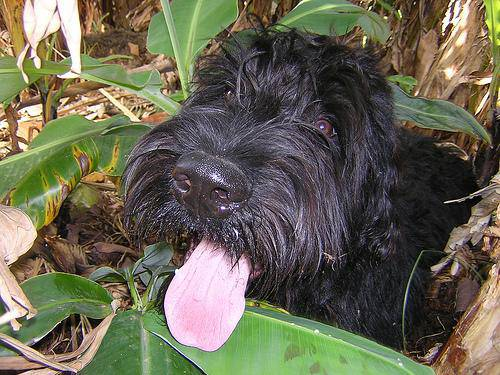

In [ ]:
Image(filepaths[55])

In [ ]:
# adorable! what breed is that?

In [ ]:
labels["breed"][55]

'giant_schnauzer'

In [ ]:
# ah! of course!

## Chaning label to numerical value

In [ ]:
unique_breeds = np.unique(labels["breed"])

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
labels["breed"][0] == unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels = [label == unique_breeds for label in labels["breed"]]
print(boolean_labels[:2])

[array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False]), array([False, False, False, False, False, False, False, Fal

In [ ]:
num_labels = [label.astype(int) for label in boolean_labels]

In [ ]:
num_labels[:2]

[array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0])]

## Split into training and validation sets

In [ ]:
from sklearn.model_selection import train_test_split
NUM_IMAGES = 1000 #@param {type: "slider", min: 1000, max: 10000, step: 1000}

In [ ]:
X_train, X_eval, y_train, y_eval = train_test_split(filepaths[:NUM_IMAGES], num_labels[:NUM_IMAGES], test_size=0.2)

In [ ]:
print(len(X_train), len(X_eval), len(y_train), len(y_eval))

800 200 800 200


## Pre-process images

In [ ]:
# first trying to turn into np array with matplotlib. Just to learn how this works.
from matplotlib.pyplot import imread

In [ ]:
image = imread(X_train[4])

In [ ]:
image

array([[[135, 136, 156],
        [118, 122, 134],
        [127, 132, 136],
        ...,
        [104,  95,  78],
        [ 60,  51,  34],
        [ 91,  82,  65]],

       [[118, 119, 139],
        [119, 123, 135],
        [157, 165, 168],
        ...,
        [ 90,  82,  63],
        [ 58,  50,  31],
        [ 65,  57,  38]],

       [[139, 142, 161],
        [123, 127, 139],
        [137, 145, 148],
        ...,
        [102,  91,  69],
        [ 92,  81,  59],
        [ 65,  54,  32]],

       ...,

       [[ 36,  78,   6],
        [ 43,  85,  13],
        [ 60, 101,  31],
        ...,
        [ 50,  87,  17],
        [ 89, 125,  55],
        [ 96, 133,  63]],

       [[ 43,  86,  15],
        [ 20,  63,   0],
        [ 56,  99,  30],
        ...,
        [ 63, 103,  33],
        [ 75, 112,  43],
        [ 91, 131,  61]],

       [[ 47,  90,  21],
        [ 23,  66,   0],
        [ 58, 100,  34],
        ...,
        [ 51,  90,  23],
        [ 62, 101,  34],
        [ 79, 118,  51]]

In [ ]:
# now turning that into a tensor

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(402, 500, 3), dtype=uint8, numpy=
array([[[135, 136, 156],
        [118, 122, 134],
        [127, 132, 136],
        ...,
        [104,  95,  78],
        [ 60,  51,  34],
        [ 91,  82,  65]],

       [[118, 119, 139],
        [119, 123, 135],
        [157, 165, 168],
        ...,
        [ 90,  82,  63],
        [ 58,  50,  31],
        [ 65,  57,  38]],

       [[139, 142, 161],
        [123, 127, 139],
        [137, 145, 148],
        ...,
        [102,  91,  69],
        [ 92,  81,  59],
        [ 65,  54,  32]],

       ...,

       [[ 36,  78,   6],
        [ 43,  85,  13],
        [ 60, 101,  31],
        ...,
        [ 50,  87,  17],
        [ 89, 125,  55],
        [ 96, 133,  63]],

       [[ 43,  86,  15],
        [ 20,  63,   0],
        [ 56,  99,  30],
        ...,
        [ 63, 103,  33],
        [ 75, 112,  43],
        [ 91, 131,  61]],

       [[ 47,  90,  21],
        [ 23,  66,   0],
        [ 58, 100,  34],
        ...,
        [ 51,  90,  2

In [ ]:
# neat! now, let's build a funtion that will do that automatically, given a file path

In [ ]:
IMAGE_SIZE = 224
def process_image(filepath):
  image = tf.io.read_file(filepath)
  image = tf.image.decode_jpeg(image, channels=3)
  #convert to values 0-1:
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize
  image = tf.image.resize(image, size=[IMAGE_SIZE, IMAGE_SIZE])
  return image

In [ ]:
print(process_image(X_train[88]))

tf.Tensor(
[[[0.27544644 0.26368174 0.23623076]
  [0.27873775 0.26697305 0.23952208]
  [0.279368   0.2676033  0.24015233]
  ...
  [0.41199228 0.3727766  0.33356088]
  [0.41836485 0.37914917 0.33993345]
  [0.4216562  0.3824405  0.3432248 ]]

 [[0.28124127 0.26947656 0.24202557]
  [0.28453258 0.27276787 0.2453169 ]
  [0.28722006 0.27545536 0.24800436]
  ...
  [0.39759278 0.35837707 0.31354162]
  [0.4035138  0.36429808 0.31946263]
  [0.4044468  0.3652311  0.32039568]]

 [[0.28235295 0.27058825 0.24313727]
  [0.28564426 0.27387956 0.2464286 ]
  [0.28970325 0.27793854 0.25048754]
  ...
  [0.3753212  0.33610553 0.2890467 ]
  [0.38050598 0.34129027 0.29423144]
  [0.38050598 0.34129027 0.29423144]]

 ...

 [[0.98857564 0.9354239  0.9064497 ]
  [0.98729724 0.93414545 0.9051713 ]
  [0.9549953  0.8949029  0.87167096]
  ...
  [0.84381413 0.8242063  0.83989257]
  [0.8409928  0.82138497 0.83707124]
  [0.8383407  0.81873286 0.83441913]]

 [[0.9938551  0.9450981  0.9260154 ]
  [0.9962134  0.9483894  0

## Turning out data into batches

In [ ]:
def get_image_label(filepath, label):
  image = process_image(filepath)
  return image, label

In [ ]:
get_image_label(X_train[99], y_train[99])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.5131262 , 0.5805261 , 0.63912815],
         [0.6059441 , 0.67098796, 0.65215576],
         [0.66343695, 0.7192318 , 0.63729334],
         ...,
         [0.75357145, 0.72219884, 0.6790616 ],
         [0.7496149 , 0.71824235, 0.6751051 ],
         [0.76283276, 0.73146015, 0.6883229 ]],
 
        [[0.66967946, 0.67835075, 0.7297749 ],
         [0.6700677 , 0.71743774, 0.6762819 ],
         [0.6093119 , 0.7037057 , 0.6102241 ],
         ...,
         [0.75646013, 0.7250875 , 0.6819503 ],
         [0.7467262 , 0.71535367, 0.6722164 ],
         [0.7558764 , 0.7245038 , 0.68136656]],
 
        [[0.737618  , 0.6934874 , 0.7108736 ],
         [0.65073794, 0.6850828 , 0.65081835],
         [0.5295308 , 0.6555689 , 0.6230917 ],
         ...,
         [0.76230747, 0.73093486, 0.6877976 ],
         [0.74645066, 0.7150781 , 0.67194086],
         [0.74867684, 0.7173043 , 0.67416704]],
 
        ...,
 
        [[0.51873946, 0.33264017

In [ ]:
BATCH_SIZE = 32
def create_image_batches(X, y=None, batch_size=BATCH_SIZE, is_test_data=False, is_validation_data=False):
  """
  creates image batches.
  by defaults create training data, unless either is_test_data or is_validation_data flags are used
  """
  if is_test_data:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  elif is_validation_data:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch


In [ ]:
train_data = create_image_batches(X_train, y_train)
val_data = create_image_batches(X_eval, y_eval, is_validation_data=True)

In [ ]:
print(train_data)

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.int32, name=None))>


## Visualizing our batched images

In [ ]:
import matplotlib.pyplot as plt
def display_image_from_batch(batch):
  images, labels = next(batch.as_numpy_iterator())
  plt.figure(figsize=(15,15))
  for i in range(32):
    ax = plt.subplot(8, 4, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

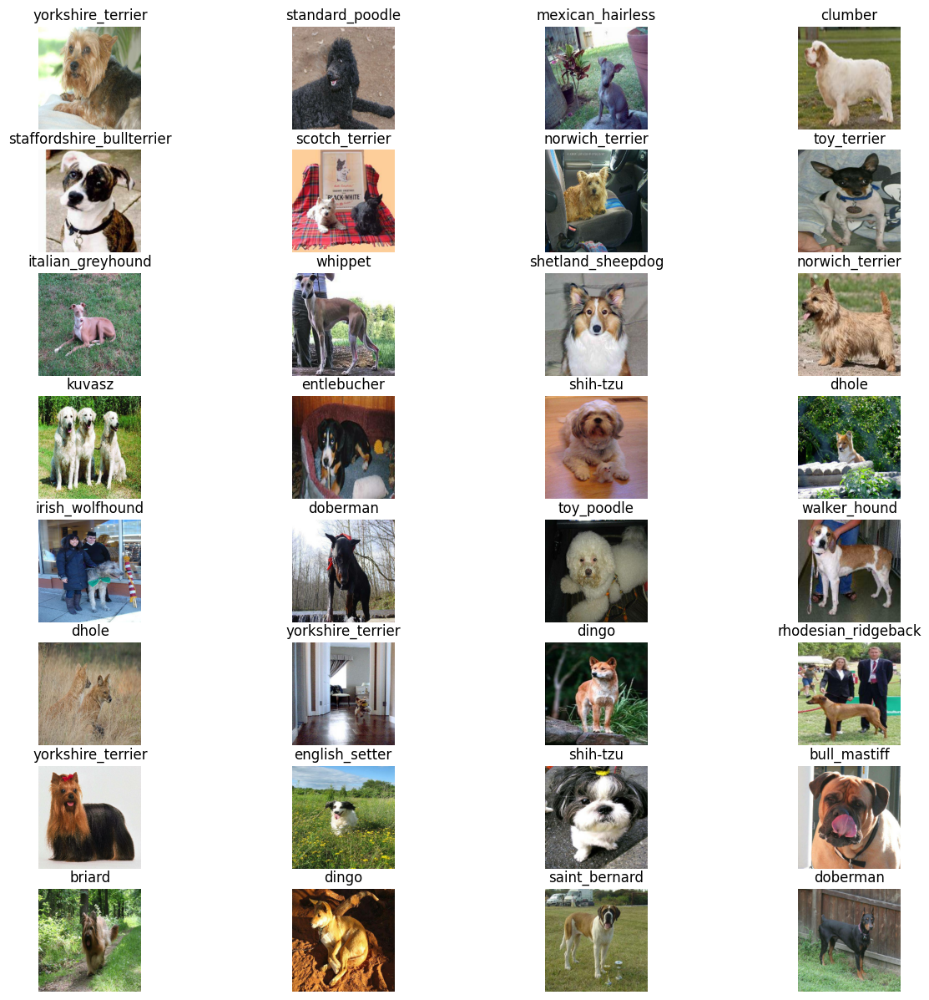

In [ ]:
display_image_from_batch(train_data)

## Building our Model

In [ ]:
INPUT_SIZE = [0, IMAGE_SIZE, IMAGE_SIZE, 3]
OUTPUT_SIZE = len(unique_breeds)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [ ]:
def create_model(input_size=INPUT_SIZE, output_size=OUTPUT_SIZE, model_url=MODEL_URL):
  model = tf.keras.Sequential([
      hub.KerasLayer(model_url),
      tf.keras.layers.Dense(units=output_size, activation="softmax")
  ])
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

  model.build(input_size)
  return model

In [ ]:
my_model = create_model()

In [ ]:
my_model

In [ ]:
my_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (0, 1001)                 5432713   
                                                                 
 dense (Dense)               (0, 120)                  120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Callback functions for our model

In [ ]:
%load_ext tensorboard
import datetime
import os

In [ ]:
def create_tensorboard_callback():
  logdir = os.path.join("drive/MyDrive/Dog Vision Project/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

In [ ]:
NUM_EPOCHS = 100
def train_model():
  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x=train_data, epochs=NUM_EPOCHS, validation_data=val_data, validation_freq=1, callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
model = train_model()

Epoch 1/100
25/25 [==============================] - 178s 7s/step - loss: 4.6911 - accuracy: 0.1025 - val_loss: 3.3645 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 3s 109ms/step - loss: 1.6822 - accuracy: 0.6862 - val_loss: 2.0638 - val_accuracy: 0.5250
Epoch 3/100
25/25 [==============================] - 3s 116ms/step - loss: 0.5836 - accuracy: 0.9413 - val_loss: 1.5753 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 3s 110ms/step - loss: 0.2469 - accuracy: 0.9912 - val_loss: 1.4038 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 3s 108ms/step - loss: 0.1436 - accuracy: 0.9987 - val_loss: 1.3281 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 3s 140ms/step - loss: 0.0982 - accuracy: 1.0000 - val_loss: 1.2793 - val_accuracy: 0.6350
Epoch 7/100
25/25 [==============================] - 3s 120ms/step - loss: 0.0754 - accuracy: 1.0000 - val_loss: 1.2512 - val_accuracy: 0.6600


In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision\ Project/logs

<IPython.core.display.Javascript object>

In [ ]:
predictions = model.predict(val_data, verbose=1)

7/7 [==============================] - 1s 82ms/step


In [ ]:
predictions[0]

array([4.4255827e-02, 3.6512030e-04, 2.6908036e-05, 7.4473093e-05,
       2.7966258e-04, 2.4147688e-05, 5.4674631e-05, 3.5249448e-04,
       6.5279826e-05, 6.0376455e-03, 6.2297902e-04, 1.4547244e-02,
       2.1354072e-03, 5.7047661e-03, 8.8163906e-06, 9.1173232e-04,
       1.7157465e-04, 2.6954755e-03, 7.2598574e-05, 4.7973171e-02,
       9.2480106e-05, 8.5845351e-04, 1.6105524e-03, 4.7613485e-05,
       1.3569547e-03, 1.3076912e-05, 2.8594979e-05, 8.8192472e-05,
       2.1429852e-04, 2.0195120e-03, 2.5415737e-05, 7.4778695e-04,
       4.2194180e-04, 1.2710238e-05, 4.0916304e-05, 5.0439001e-05,
       9.5011478e-07, 3.6538866e-06, 4.3798081e-04, 4.4741060e-05,
       3.0407591e-03, 2.6175883e-04, 6.2745274e-04, 2.4588653e-06,
       1.2116476e-03, 1.6301345e-04, 5.3215372e-06, 6.4022276e-03,
       4.1128407e-04, 6.7515089e-04, 1.5557864e-04, 2.0748904e-04,
       7.6149945e-04, 1.4548261e-04, 1.9851404e-06, 8.7053180e-05,
       3.0444367e-04, 7.0962805e-04, 1.4124723e-04, 2.2283859e

In [ ]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
get_pred_label(predictions[44])

'welsh_springer_spaniel'

In [ ]:
def unbatchify(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(label)

  return images, labels

In [ ]:
val_images, val_labels = unbatchify(val_data)

In [ ]:
val_images[0]

array([[[0.02253128, 0.        , 0.006845  ],
        [0.02465057, 0.00896429, 0.01288586],
        [0.02289916, 0.00784314, 0.01176471],
        ...,
        [0.00392157, 0.        , 0.        ],
        [0.00784314, 0.00392157, 0.        ],
        [0.00784314, 0.00392157, 0.        ]],

       [[0.02752171, 0.0039923 , 0.0039923 ],
        [0.03474265, 0.01121324, 0.01121324],
        [0.02713585, 0.01144958, 0.00752801],
        ...,
        [0.00392157, 0.        , 0.        ],
        [0.00784314, 0.00392157, 0.        ],
        [0.00784314, 0.00392157, 0.        ]],

       [[0.04288223, 0.01397817, 0.00860352],
        [0.04253147, 0.02046569, 0.01281161],
        [0.0325105 , 0.0141369 , 0.00484069],
        ...,
        [0.00392157, 0.        , 0.        ],
        [0.00784314, 0.00392157, 0.        ],
        [0.00784314, 0.00392157, 0.        ]],

       ...,

       [[0.11538102, 0.03694964, 0.00949866],
        [0.1254902 , 0.03529412, 0.01176471],
        [0.12994283, 0

In [ ]:
val_labels[0]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [ ]:
def plot_pred(pred_probabilities, labels, images, n=1):
  pred_prod, true_label, image = pred_probabilities[n], unique_breeds[np.argmax(labels[n])], images[n]
  pred_label = get_pred_label(pred_prod)
  plt.imshow(image)
  plt.title("{} {:2f}% {}".format(pred_label, np.max(pred_prod) * 100, true_label))

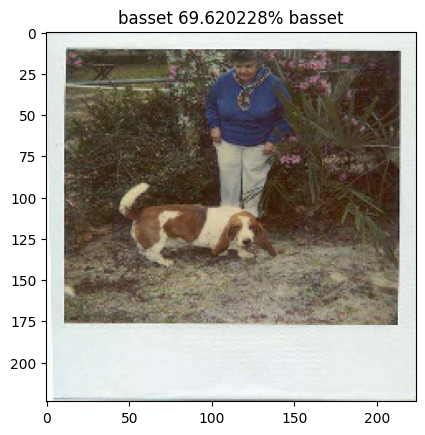

In [ ]:
plot_pred(pred_probabilities=predictions, labels=val_labels, images=val_images)

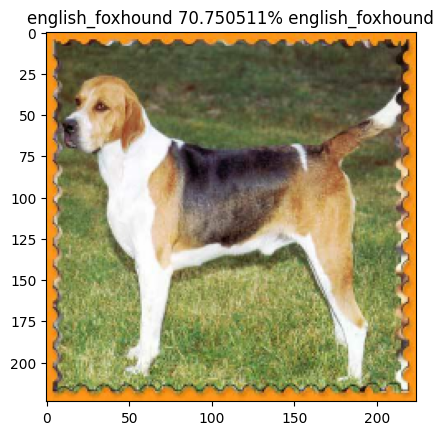

In [ ]:
plot_pred(pred_probabilities=predictions, labels=val_labels, images=val_images, n=130)

## Training a model with full data

In [ ]:
len(filepaths)

10222

In [ ]:
len(num_labels)

10222

In [ ]:
full_data = create_image_batches(filepaths, num_labels)

In [ ]:
full_model = create_model()

In [ ]:
full_model_tensorboard = create_tensorboard_callback()

In [ ]:
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

In [ ]:
full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1394s 4s/step - loss: 1.3549 - accuracy: 0.6682
Epoch 2/100
320/320 [==============================] - 32s 101ms/step - loss: 0.4037 - accuracy: 0.8795
Epoch 3/100
320/320 [==============================] - 31s 96ms/step - loss: 0.2358 - accuracy: 0.9352
Epoch 4/100
320/320 [==============================] - 31s 96ms/step - loss: 0.1534 - accuracy: 0.9623
Epoch 5/100
320/320 [==============================] - 30s 93ms/step - loss: 0.1045 - accuracy: 0.9794
Epoch 6/100
320/320 [==============================] - 29s 91ms/step - loss: 0.0776 - accuracy: 0.9856
Epoch 7/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0572 - accuracy: 0.9925
Epoch 8/100
320/320 [==============================] - 32s 98ms/step - loss: 0.0446 - accuracy: 0.9948
Epoch 9/100
320/320 [==============================] - 30s 92ms/step - loss: 0.0372 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 29s 91ms/step - 

In [ ]:
full_model.save("drive/MyDrive/Dog Vision Project/models/full_model.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
custom_data = create_image_batches(["drive/MyDrive/Dog Vision Project/photos/20230526_170744.jpg", "/content/drive/MyDrive/Dog Vision Project/photos/20231010_150129.jpg"], is_test_data=True)

In [ ]:
custom_preds = full_model.predict(custom_data)

UnimplementedError: ignored

In [ ]:
custom_labels = get_pred_label(custom_preds[1])

In [ ]:
custom_labels

'pug'

In [ ]:
custom_preds

array([[9.21678532e-12, 1.16890594e-11, 1.10192772e-10, 3.75355108e-10,
        2.11665068e-08, 2.43748786e-07, 2.14836786e-12, 8.00427216e-13,
        7.61626179e-12, 1.09785089e-11, 3.46190221e-12, 2.50241370e-13,
        3.99204910e-05, 2.12289301e-12, 1.25089550e-10, 3.63075685e-08,
        7.46749791e-08, 1.04537676e-08, 1.04363837e-10, 9.53789391e-12,
        2.07939133e-09, 2.46139359e-11, 1.64428998e-10, 2.89899008e-12,
        6.00553773e-11, 6.93546376e-09, 3.54720119e-14, 3.10733557e-11,
        8.21321805e-07, 1.41422911e-13, 6.42813719e-11, 8.53221747e-12,
        2.96638769e-10, 3.84837495e-09, 2.76565365e-02, 2.38344015e-11,
        2.21277441e-09, 1.94729166e-09, 9.04674451e-08, 2.13320802e-11,
        7.48245771e-11, 9.72433356e-10, 3.28316041e-10, 2.17303939e-10,
        2.37752465e-05, 1.53398561e-11, 4.18628110e-09, 3.13969736e-07,
        1.95412576e-06, 1.16440395e-08, 2.35808906e-09, 5.13642249e-07,
        2.46510883e-08, 9.31007662e-08, 1.25282007e-10, 8.521994